<a href="https://colab.research.google.com/github/UtharaS123/Vanila-GAN_MNIST/blob/main/VanilaGAN_FMNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generating FMNIST data using Vanila GAN
we will generate the digit images from the FashionMNIST dataset using vanilla GAN. We will use the PyTorch deep learning framework to build and train the Generative Adversarial Network.

GANs contail two neural networks in their architecture. One is the generator and the other one is the discriminator.

While training a GAN, the generator tries to generate new fake data from a given noisy sample space. And with each iteration, it tries to generate more and more realistic data.

At the same time, the discriminator tries to differentiate the real data from the generated fake data of the generator. While training the discriminator, we provide it with both, the real data (positive examples) and the generated data (negative examples). A time will come when the discriminator won’t be able to tell whether the data is real or fake (generated by the generator). This is the time we stop the training and can successfully use the generator to generate realistic data that resembles the input data.

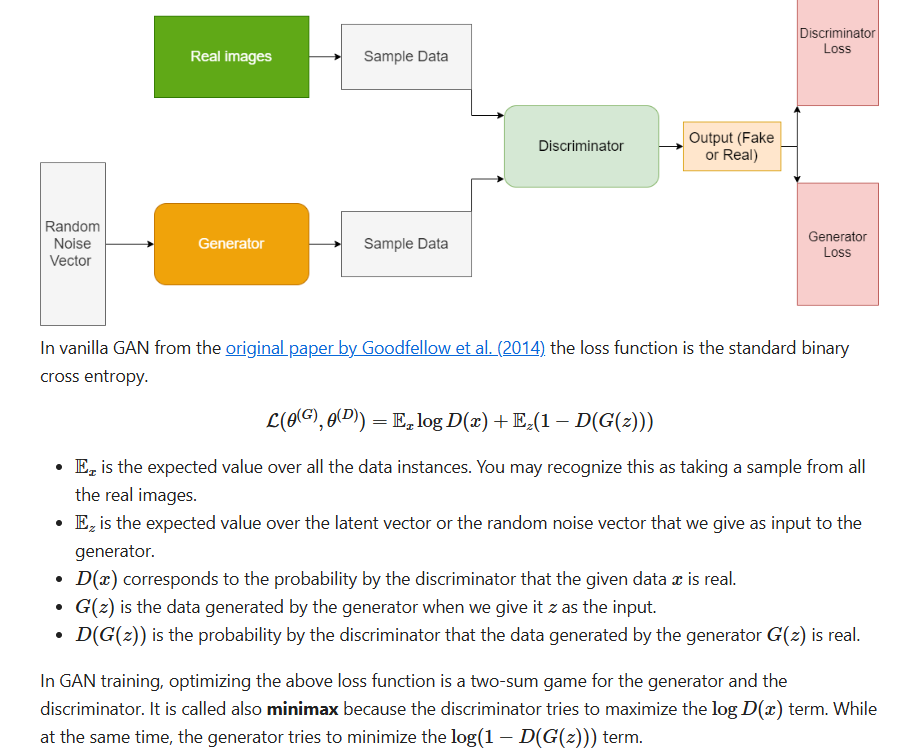

# Build and Train GAN

In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib

from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

matplotlib.style.use('ggplot')


Among all the known modules, we are also importing the make_grid and save_image functions from torchvision.utils. These two functions will help us save PyTorch tensor images in a very effective and easy manner without much hassle.

In [2]:

# we need input and output folders to locally save the dataset and to save the output model
!mkdir input
!mkdir outputs

# Hyperpars definition
Let's define the learning parameters for our generative adversarial network. You should now be familiar with most except for:

nz: This is the latent vector or the noise vector size. The input feature size for the generator is going to be the same as this latent vector size.
sample_size the number of fake images to be generated by the generator from the fixed-size noise vector.
k: the number of gradient descent steps for the discriminator before one step for the generator is

In [3]:


#learning parameters
batch_size = 512
epochs = 200
sample_size = 64 # fixed sample size
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Download and Inspect dataset
We will define the dataset transforms first. The following block of code defines the image transforms that we need for the MNIST dataset.

In [4]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])

to_pil_image = transforms.ToPILImage()

first we define transform which will convert the image to tensors and normalizes them as well
second, the to_pil_image will convert the images from PyTorch tensors to the PIL (Python Image Library) image format for standard python libraries to be digested.
The next block of code defines the training dataset and training data loader. We will download the FashionMNIST dataset using the dataset module from torchvision.

In [5]:
train_data = datasets.FashionMNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

100%|██████████| 26.4M/26.4M [00:02<00:00, 9.69MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 137kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 2.70MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 11.8MB/s]


In [6]:
!ls input/data/FashionMNIST/raw

t10k-images-idx3-ubyte	   train-images-idx3-ubyte
t10k-images-idx3-ubyte.gz  train-images-idx3-ubyte.gz
t10k-labels-idx1-ubyte	   train-labels-idx1-ubyte
t10k-labels-idx1-ubyte.gz  train-labels-idx1-ubyte.gz


In [7]:
def show_images(images, labels, classes, nimages=4):
    fig, axs = plt.subplots(1, nimages, figsize=(10, 5))
    for i in range(nimages):
        image = images[i]
        axs[i].imshow(image.numpy().squeeze(), cmap='gray')
        axs[i].set_title(classes[labels[i]])
        axs[i].axis('off')
    plt.show()


In [8]:

examples = enumerate(train_loader)
batch_idx, (example_data, example_targets) = next(examples)
example_data.shape

torch.Size([512, 1, 28, 28])

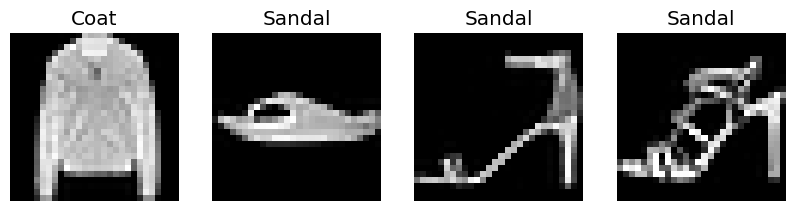

In [9]:

classes = train_data.classes
show_images(example_data, example_targets, classes)


The Generator Neural Network
Let’s start with building the generator neural network.

It is going to be a very simple network with Linear layers, and LeakyReLU activations in-between.

In [10]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),

            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),

            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),

            nn.Linear(1024, 784),
            nn.Tanh(),
        )

    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)


We have the __init__() function which accepts the nz parameter which is going to be the number of input features for the first linear layer of the generator network.

We are using the Sequential container to build the neural network. The first linear layer has in_features equal to nz, that is equal to 128. The out_features is equal to 256. Then we have a LeakyReLU activation with negative slope of 0.2. We have a total of four Linear layers and three LearkyReLU activations. The last layer’s activation is Tanh.

Then we have the forward() function which does a forward pass of the batch of images through the neural network. It returns the outputs after reshaping them into batch_size x 1 x 28 x 28.


The Discriminator Neural Network
Here we will define the discriminator neural network.

Remember that the discriminator is a binary classifier. Therefore, we will have to take that into consideration while building the discriminator neural network.

In [11]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),

            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

we define self.n_input = 784 which is the flattened size of the MNIST images (28×28). This is going to be the in_feature for the first layer.
we define the discriminator network using the Sequential container. Here, we use Linear layers and LeakyReLU activations as well. Along with that, we use Dropout with rate of 0.3 after the first three Linear layers.
we are using the Sigmoid activation after the last Linear layer.
the forward() function makes a forward pass of the data through the discriminator network. It returns the binary classification of whether an image is fake or real (0 or 1).

# Define full model

In [12]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)

print('##### GENERATOR #####')
print(generator)
print('######################')

print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

# loss function
criterion = nn.BCELoss()

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

Some utility functions
While training the generator and the discriminator, we need to store the epoch-wise loss values for both the networks. We will define two lists for this task. We will also need to store the images that are generated by the generator after each epoch. For that also, we will use a list.

In [13]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

For training the GAN in this tutorial, we need the real image data and the fake image data from the generator. To calculate the loss, we also need real labels and the fake labels. Those will have to be tensors whose size should be equal to the batch size.

Let’s define two functions, which will create tensors of 1s (ones) and 0s (zeros) for us whose size will be equal to the batch size.

In [14]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)

# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

For generating fake images, we need to provide the generator with a noise vector. The size of the noise vector should be equal to nz (128) that we have defined earlier. To create this noise vector, we can define a function called create_noise().

In [15]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

There is one final utility function. We need to save the images generated by the generator after each epoch. Now, they are torch tensors. To save those easily, we can define a function which takes those batch of images and saves them in a grid-like structure.



In [16]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)


train functions
First, we will write the function to train the discriminator, then we will move into the generator part.

Let’s write the code first, then we will move onto the explanation part.

In [17]:
# function to train the discriminator network
def train_discriminator(optimizer, data_real, data_fake):
    b_size = data_real.size(0)
    real_label = label_real(b_size)
    fake_label = label_fake(b_size)

    optimizer.zero_grad()

    output_real = discriminator(data_real)
    loss_real = criterion(output_real, real_label)

    output_fake = discriminator(data_fake)
    loss_fake = criterion(output_fake, fake_label)


    loss_real.backward()
    loss_fake.backward()
    optimizer.step()

    return loss_real + loss_fake

we get the batch size of the data. Then we use the batch size to create the fake and real labels.
before doing any training, we first set the gradients to zero
we get the output_real by doing a forward pass of the real data (data_real) through the discriminator. We calculates the loss for the real outputs and the real labels.
we get fake outputs using fake data and calculate the loss for the fake outputs and the fake labels.
we backpropagate the gradients for the fake and the real loss and update the parameters as well
we return the total loss for the discriminator network.
Now, we will write the code to train the generator. This is going to a bit simpler than the discriminator coding.

In [18]:
# function to train the generator network
def train_generator(optimizer, data_fake):
    b_size = data_fake.size(0)
    real_label = label_real(b_size)

    optimizer.zero_grad()

    output = discriminator(data_fake)
    loss = criterion(output, real_label)

    loss.backward()
    optimizer.step()

    return loss

we get the batch size and then create the real labels. Remember that the fake data is actually real for the generator. Therefore, we are using real labels (ones) for training the generator network.
we set the gradients to zero.
we pass the fake data through the discriminator and get the outputs then we calculate the loss using the outputs and the real labels -- remember that the generator only generates fake data and it improves after each iteration by taking in the feedback from the discriminator.
we backpropagate the gradients.
we update the generator parameters and not the discriminator parameters. Because in this step, we want the generator to learn, not the discriminator. The optimizer parameter in the function definition is the optim_g that we will pass as the argument while calling the function.


Train full GAN model
In this section, we will write the code to train the GAN for some epochs.

First, let’s create the noise vector that we will need to generate the fake data using the generator network.

In [19]:
# create the noise vector
noise = create_noise(sample_size, nz)


In [20]:
generator.train()
discriminator.train()


Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1, bias=True)
    (10): Sigmoid()
  )
)

In [21]:
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        image, _ = data
        image = image.to(device)
        b_size = len(image)
        # run the discriminator for k number of steps
        for step in range(k):
            data_fake = generator(create_noise(b_size, nz)).detach()
            data_real = image
            # train the discriminator network
            loss_d += train_discriminator(optim_d, data_real, data_fake)
        data_fake = generator(create_noise(b_size, nz))
        # train the generator network
        loss_g += train_generator(optim_g, data_fake)

    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    # make the images as grid
    generated_img = make_grid(generated_img)
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)

    print(f"Epoch {epoch} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')


118it [00:15,  7.49it/s]                         


Epoch 0 of 200
Generator loss: 1.57404721, Discriminator loss: 0.93865436


118it [00:19,  6.14it/s]                         


Epoch 1 of 200
Generator loss: 1.72625911, Discriminator loss: 0.69112867


118it [00:14,  8.05it/s]                         


Epoch 2 of 200
Generator loss: 2.76013017, Discriminator loss: 0.43513003


118it [00:15,  7.50it/s]                         


Epoch 3 of 200
Generator loss: 3.21056700, Discriminator loss: 0.88901263


118it [00:14,  7.87it/s]                         


Epoch 4 of 200
Generator loss: 2.65442848, Discriminator loss: 0.66284621


118it [00:14,  8.37it/s]                         


Epoch 5 of 200
Generator loss: 4.05626488, Discriminator loss: 0.48790449


118it [00:14,  7.91it/s]                         


Epoch 6 of 200
Generator loss: 2.80140853, Discriminator loss: 0.80005646


118it [00:13,  8.53it/s]                         


Epoch 7 of 200
Generator loss: 2.50974321, Discriminator loss: 0.73494208


118it [00:13,  8.54it/s]                         


Epoch 8 of 200
Generator loss: 2.92787552, Discriminator loss: 0.61633754


118it [00:13,  8.51it/s]                         


Epoch 9 of 200
Generator loss: 3.60039234, Discriminator loss: 0.68816054


118it [00:14,  7.97it/s]                         


Epoch 10 of 200
Generator loss: 3.48689961, Discriminator loss: 0.48103607


118it [00:14,  8.35it/s]                         


Epoch 11 of 200
Generator loss: 3.42259288, Discriminator loss: 0.51207560


118it [00:14,  8.12it/s]                         


Epoch 12 of 200
Generator loss: 3.55155921, Discriminator loss: 0.44237819


118it [00:14,  8.23it/s]                         


Epoch 13 of 200
Generator loss: 4.00175333, Discriminator loss: 0.33232892


118it [00:13,  8.51it/s]                         


Epoch 14 of 200
Generator loss: 4.13041067, Discriminator loss: 0.41026819


118it [00:13,  8.61it/s]                         


Epoch 15 of 200
Generator loss: 4.13680935, Discriminator loss: 0.39509976


118it [00:13,  8.45it/s]                         


Epoch 16 of 200
Generator loss: 4.31770229, Discriminator loss: 0.34342653


118it [00:13,  8.43it/s]                         


Epoch 17 of 200
Generator loss: 4.18715334, Discriminator loss: 0.50471532


118it [00:14,  8.42it/s]                         


Epoch 18 of 200
Generator loss: 3.35204339, Discriminator loss: 0.48599660


118it [00:13,  8.52it/s]                         


Epoch 19 of 200
Generator loss: 3.31719542, Discriminator loss: 0.49066344


118it [00:13,  8.47it/s]                         


Epoch 20 of 200
Generator loss: 3.87419367, Discriminator loss: 0.35423765


118it [00:14,  8.34it/s]                         


Epoch 21 of 200
Generator loss: 3.80221915, Discriminator loss: 0.38398743


118it [00:14,  8.32it/s]                         


Epoch 22 of 200
Generator loss: 3.57849264, Discriminator loss: 0.48621443


118it [00:13,  8.49it/s]                         


Epoch 23 of 200
Generator loss: 3.46105218, Discriminator loss: 0.44149476


118it [00:13,  8.44it/s]                         


Epoch 24 of 200
Generator loss: 2.89602232, Discriminator loss: 0.44989482


118it [00:14,  8.42it/s]                         


Epoch 25 of 200
Generator loss: 3.43647933, Discriminator loss: 0.50407851


118it [00:13,  8.50it/s]                         


Epoch 26 of 200
Generator loss: 3.18672752, Discriminator loss: 0.54925907


118it [00:13,  8.47it/s]                         


Epoch 27 of 200
Generator loss: 3.32874131, Discriminator loss: 0.42755291


118it [00:13,  8.65it/s]                         


Epoch 28 of 200
Generator loss: 3.20606685, Discriminator loss: 0.51601750


118it [00:13,  8.55it/s]                         


Epoch 29 of 200
Generator loss: 3.02559137, Discriminator loss: 0.51771343


118it [00:14,  8.29it/s]                         


Epoch 30 of 200
Generator loss: 3.23463440, Discriminator loss: 0.40037215


118it [00:14,  8.21it/s]                         


Epoch 31 of 200
Generator loss: 3.31231308, Discriminator loss: 0.48364189


118it [00:14,  8.21it/s]                         


Epoch 32 of 200
Generator loss: 3.28755975, Discriminator loss: 0.50026405


118it [00:13,  8.59it/s]                         


Epoch 33 of 200
Generator loss: 2.98329687, Discriminator loss: 0.57201672


118it [00:13,  8.49it/s]                         


Epoch 34 of 200
Generator loss: 2.72756505, Discriminator loss: 0.54547387


118it [00:13,  8.49it/s]                         


Epoch 35 of 200
Generator loss: 2.95418072, Discriminator loss: 0.49859014


118it [00:14,  8.35it/s]                         


Epoch 36 of 200
Generator loss: 2.86350751, Discriminator loss: 0.57383364


118it [00:13,  8.45it/s]                         


Epoch 37 of 200
Generator loss: 2.70205164, Discriminator loss: 0.59604228


118it [00:13,  8.54it/s]                         


Epoch 38 of 200
Generator loss: 2.59797859, Discriminator loss: 0.62141013


118it [00:13,  8.55it/s]                         


Epoch 39 of 200
Generator loss: 2.67591143, Discriminator loss: 0.57618940


118it [00:14,  8.36it/s]                         


Epoch 40 of 200
Generator loss: 2.75710726, Discriminator loss: 0.56945330


118it [00:14,  8.10it/s]                         


Epoch 41 of 200
Generator loss: 2.91632390, Discriminator loss: 0.52880645


118it [00:14,  8.37it/s]                         


Epoch 42 of 200
Generator loss: 3.01053834, Discriminator loss: 0.47669393


118it [00:13,  8.44it/s]                         


Epoch 43 of 200
Generator loss: 2.99187756, Discriminator loss: 0.48520914


118it [00:13,  8.51it/s]                         


Epoch 44 of 200
Generator loss: 2.56465912, Discriminator loss: 0.62415147


118it [00:13,  8.71it/s]                         


Epoch 45 of 200
Generator loss: 2.68649197, Discriminator loss: 0.58463919


118it [00:13,  8.64it/s]                         


Epoch 46 of 200
Generator loss: 2.40976667, Discriminator loss: 0.63118577


118it [00:14,  8.13it/s]                         


Epoch 47 of 200
Generator loss: 2.49469423, Discriminator loss: 0.63911670


118it [00:14,  7.88it/s]                         


Epoch 48 of 200
Generator loss: 2.46998906, Discriminator loss: 0.69499177


118it [00:15,  7.51it/s]                         


Epoch 49 of 200
Generator loss: 2.39287806, Discriminator loss: 0.65866685


118it [00:14,  7.94it/s]                         


Epoch 50 of 200
Generator loss: 2.47855783, Discriminator loss: 0.63493222


118it [00:15,  7.84it/s]                         


Epoch 51 of 200
Generator loss: 2.38562226, Discriminator loss: 0.66863185


118it [00:14,  7.96it/s]                         


Epoch 52 of 200
Generator loss: 2.46708059, Discriminator loss: 0.63537514


118it [00:14,  8.08it/s]                         


Epoch 53 of 200
Generator loss: 2.35278964, Discriminator loss: 0.67939383


118it [00:14,  7.99it/s]                         


Epoch 54 of 200
Generator loss: 2.33302641, Discriminator loss: 0.66858053


118it [00:15,  7.53it/s]                         


Epoch 55 of 200
Generator loss: 2.41130543, Discriminator loss: 0.66267097


118it [00:14,  8.03it/s]                         


Epoch 56 of 200
Generator loss: 2.35532117, Discriminator loss: 0.64951372


118it [00:14,  7.97it/s]                         


Epoch 57 of 200
Generator loss: 2.38356423, Discriminator loss: 0.63159150


118it [00:15,  7.81it/s]                         


Epoch 58 of 200
Generator loss: 2.33790874, Discriminator loss: 0.62207437


118it [00:15,  7.64it/s]                         


Epoch 59 of 200
Generator loss: 2.56053233, Discriminator loss: 0.59232348


118it [00:15,  7.72it/s]                         


Epoch 60 of 200
Generator loss: 2.44526219, Discriminator loss: 0.67882830


118it [00:15,  7.73it/s]                         


Epoch 61 of 200
Generator loss: 2.44142675, Discriminator loss: 0.66021705


118it [00:14,  7.94it/s]                         


Epoch 62 of 200
Generator loss: 2.41595888, Discriminator loss: 0.61794585


118it [00:14,  7.90it/s]                         


Epoch 63 of 200
Generator loss: 2.40062237, Discriminator loss: 0.66141897


118it [00:15,  7.38it/s]                         


Epoch 64 of 200
Generator loss: 2.28117728, Discriminator loss: 0.67567009


118it [00:16,  7.02it/s]                         


Epoch 65 of 200
Generator loss: 2.27987909, Discriminator loss: 0.67226243


118it [00:16,  7.04it/s]                         


Epoch 66 of 200
Generator loss: 2.36652398, Discriminator loss: 0.63260663


118it [00:16,  6.99it/s]                         


Epoch 67 of 200
Generator loss: 2.28313088, Discriminator loss: 0.66010970


118it [00:16,  7.06it/s]                         


Epoch 68 of 200
Generator loss: 2.28953958, Discriminator loss: 0.65429217


118it [00:17,  6.75it/s]                         


Epoch 69 of 200
Generator loss: 2.31354904, Discriminator loss: 0.63920242


118it [00:16,  7.36it/s]                         


Epoch 70 of 200
Generator loss: 2.42235637, Discriminator loss: 0.61885184


118it [00:15,  7.43it/s]                         


Epoch 71 of 200
Generator loss: 2.37770939, Discriminator loss: 0.65543139


118it [00:15,  7.55it/s]                         


Epoch 72 of 200
Generator loss: 2.29558301, Discriminator loss: 0.68322551


118it [00:16,  7.11it/s]                         


Epoch 73 of 200
Generator loss: 2.29102612, Discriminator loss: 0.68702483


118it [00:15,  7.49it/s]                         


Epoch 74 of 200
Generator loss: 2.28769445, Discriminator loss: 0.69001108


118it [00:15,  7.65it/s]                         


Epoch 75 of 200
Generator loss: 2.36741138, Discriminator loss: 0.65469182


118it [00:15,  7.64it/s]                         


Epoch 76 of 200
Generator loss: 2.39579868, Discriminator loss: 0.63928008


118it [00:15,  7.76it/s]                         


Epoch 77 of 200
Generator loss: 2.17292023, Discriminator loss: 0.71694148


118it [00:16,  7.14it/s]                         


Epoch 78 of 200
Generator loss: 2.41254115, Discriminator loss: 0.63674456


118it [00:15,  7.57it/s]                         


Epoch 79 of 200
Generator loss: 2.23508310, Discriminator loss: 0.69091004


118it [00:15,  7.64it/s]                         


Epoch 80 of 200
Generator loss: 2.26481628, Discriminator loss: 0.68549007


118it [00:15,  7.75it/s]                         


Epoch 81 of 200
Generator loss: 2.11702752, Discriminator loss: 0.71547037


118it [00:15,  7.70it/s]                         


Epoch 82 of 200
Generator loss: 2.24037719, Discriminator loss: 0.66558594


118it [00:16,  7.35it/s]                         


Epoch 83 of 200
Generator loss: 2.14619851, Discriminator loss: 0.74827290


118it [00:15,  7.84it/s]                         


Epoch 84 of 200
Generator loss: 2.15593815, Discriminator loss: 0.70092350


118it [00:15,  7.60it/s]                         


Epoch 85 of 200
Generator loss: 2.04596233, Discriminator loss: 0.76081395


118it [00:15,  7.73it/s]                         


Epoch 86 of 200
Generator loss: 2.14110780, Discriminator loss: 0.69166023


118it [00:15,  7.67it/s]                         


Epoch 87 of 200
Generator loss: 2.08219337, Discriminator loss: 0.71435839


118it [00:16,  7.22it/s]                         


Epoch 88 of 200
Generator loss: 2.08451676, Discriminator loss: 0.72190881


118it [00:15,  7.59it/s]                         


Epoch 89 of 200
Generator loss: 2.18419361, Discriminator loss: 0.70299911


118it [00:15,  7.52it/s]                         


Epoch 90 of 200
Generator loss: 2.09220648, Discriminator loss: 0.72386450


118it [00:15,  7.54it/s]                         


Epoch 91 of 200
Generator loss: 2.12511659, Discriminator loss: 0.71945530


118it [00:15,  7.55it/s]                         


Epoch 92 of 200
Generator loss: 1.97203422, Discriminator loss: 0.76483917


118it [00:16,  7.21it/s]                         


Epoch 93 of 200
Generator loss: 1.99555838, Discriminator loss: 0.75222278


118it [00:15,  7.75it/s]                         


Epoch 94 of 200
Generator loss: 1.96530187, Discriminator loss: 0.75900072


118it [00:15,  7.67it/s]                         


Epoch 95 of 200
Generator loss: 2.07579827, Discriminator loss: 0.71875465


118it [00:15,  7.70it/s]                         


Epoch 96 of 200
Generator loss: 2.07983780, Discriminator loss: 0.72396475


118it [00:15,  7.66it/s]                         


Epoch 97 of 200
Generator loss: 1.92520165, Discriminator loss: 0.77607423


118it [00:16,  7.17it/s]                         


Epoch 98 of 200
Generator loss: 1.94717765, Discriminator loss: 0.79297298


118it [00:15,  7.72it/s]                         


Epoch 99 of 200
Generator loss: 1.90265632, Discriminator loss: 0.80855799


118it [00:15,  7.68it/s]                         


Epoch 100 of 200
Generator loss: 1.87127686, Discriminator loss: 0.75455981


118it [00:15,  7.61it/s]                         


Epoch 101 of 200
Generator loss: 1.88804889, Discriminator loss: 0.77372628


118it [00:15,  7.67it/s]                         


Epoch 102 of 200
Generator loss: 1.78752303, Discriminator loss: 0.83376986


118it [00:15,  7.42it/s]                         


Epoch 103 of 200
Generator loss: 1.93321824, Discriminator loss: 0.76443386


118it [00:15,  7.63it/s]                         


Epoch 104 of 200
Generator loss: 1.85178947, Discriminator loss: 0.78125149


118it [00:15,  7.78it/s]                         


Epoch 105 of 200
Generator loss: 1.92604125, Discriminator loss: 0.80366248


118it [00:15,  7.76it/s]                         


Epoch 106 of 200
Generator loss: 1.88797212, Discriminator loss: 0.78785235


118it [00:15,  7.77it/s]                         


Epoch 107 of 200
Generator loss: 1.85794616, Discriminator loss: 0.79679966


118it [00:16,  7.31it/s]                         


Epoch 108 of 200
Generator loss: 1.78135502, Discriminator loss: 0.83385366


118it [00:15,  7.80it/s]                         


Epoch 109 of 200
Generator loss: 1.91994619, Discriminator loss: 0.75428343


118it [00:15,  7.80it/s]                         


Epoch 110 of 200
Generator loss: 1.94971299, Discriminator loss: 0.74509525


118it [00:14,  7.98it/s]                         


Epoch 111 of 200
Generator loss: 1.93242145, Discriminator loss: 0.74659956


118it [00:14,  7.87it/s]                         


Epoch 112 of 200
Generator loss: 1.99852467, Discriminator loss: 0.77259952


118it [00:16,  7.24it/s]                         


Epoch 113 of 200
Generator loss: 1.78241289, Discriminator loss: 0.79342395


118it [00:16,  7.19it/s]                         


Epoch 114 of 200
Generator loss: 1.81179452, Discriminator loss: 0.82331663


118it [00:15,  7.41it/s]                         


Epoch 115 of 200
Generator loss: 1.71124303, Discriminator loss: 0.82434183


118it [00:15,  7.40it/s]                         


Epoch 116 of 200
Generator loss: 1.78209007, Discriminator loss: 0.82722944


118it [00:15,  7.74it/s]                         


Epoch 117 of 200
Generator loss: 1.76997888, Discriminator loss: 0.83128458


118it [00:16,  7.32it/s]                         


Epoch 118 of 200
Generator loss: 1.76817501, Discriminator loss: 0.79823583


118it [00:15,  7.57it/s]                         


Epoch 119 of 200
Generator loss: 1.91682279, Discriminator loss: 0.80184430


118it [00:16,  7.29it/s]                         


Epoch 120 of 200
Generator loss: 1.80629241, Discriminator loss: 0.79842317


118it [00:15,  7.52it/s]                         


Epoch 121 of 200
Generator loss: 1.78620529, Discriminator loss: 0.84118468


118it [00:16,  7.02it/s]                         


Epoch 122 of 200
Generator loss: 1.81015527, Discriminator loss: 0.78633779


118it [00:16,  7.23it/s]                         


Epoch 123 of 200
Generator loss: 1.91766524, Discriminator loss: 0.75435740


118it [00:16,  7.34it/s]                         


Epoch 124 of 200
Generator loss: 1.89923429, Discriminator loss: 0.77939558


118it [00:15,  7.46it/s]                         


Epoch 125 of 200
Generator loss: 1.91222405, Discriminator loss: 0.75691050


118it [00:15,  7.58it/s]                         


Epoch 126 of 200
Generator loss: 1.90363359, Discriminator loss: 0.76147771


118it [00:15,  7.39it/s]                         


Epoch 127 of 200
Generator loss: 1.89360189, Discriminator loss: 0.80253410


118it [00:15,  7.51it/s]                         


Epoch 128 of 200
Generator loss: 1.73177397, Discriminator loss: 0.83333850


118it [00:15,  7.56it/s]                         


Epoch 129 of 200
Generator loss: 1.78773439, Discriminator loss: 0.81097490


118it [00:15,  7.61it/s]                         


Epoch 130 of 200
Generator loss: 1.85666847, Discriminator loss: 0.78076416


118it [00:15,  7.54it/s]                         


Epoch 131 of 200
Generator loss: 1.69362569, Discriminator loss: 0.83404404


118it [00:15,  7.41it/s]                         


Epoch 132 of 200
Generator loss: 1.75364208, Discriminator loss: 0.84301066


118it [00:15,  7.63it/s]                         


Epoch 133 of 200
Generator loss: 1.64850938, Discriminator loss: 0.84708411


118it [00:15,  7.74it/s]                         


Epoch 134 of 200
Generator loss: 1.72236800, Discriminator loss: 0.82653999


118it [00:16,  7.34it/s]                         


Epoch 135 of 200
Generator loss: 1.71348441, Discriminator loss: 0.82302970


118it [00:16,  7.25it/s]                         


Epoch 136 of 200
Generator loss: 1.71338737, Discriminator loss: 0.82291859


118it [00:15,  7.41it/s]                         


Epoch 137 of 200
Generator loss: 1.66526115, Discriminator loss: 0.85123956


118it [00:15,  7.56it/s]                         


Epoch 138 of 200
Generator loss: 1.75682223, Discriminator loss: 0.80415136


118it [00:15,  7.60it/s]                         


Epoch 139 of 200
Generator loss: 1.79817271, Discriminator loss: 0.82252765


118it [00:15,  7.54it/s]                         


Epoch 140 of 200
Generator loss: 1.67817509, Discriminator loss: 0.83689469


118it [00:16,  7.37it/s]                         


Epoch 141 of 200
Generator loss: 1.76993406, Discriminator loss: 0.80756110


118it [00:15,  7.73it/s]                         


Epoch 142 of 200
Generator loss: 1.65164804, Discriminator loss: 0.86167049


118it [00:15,  7.66it/s]                         


Epoch 143 of 200
Generator loss: 1.73376489, Discriminator loss: 0.84892827


118it [00:16,  7.35it/s]                         


Epoch 144 of 200
Generator loss: 1.81897283, Discriminator loss: 0.81757081


118it [00:16,  7.32it/s]                         


Epoch 145 of 200
Generator loss: 1.79671144, Discriminator loss: 0.79382718


118it [00:16,  7.14it/s]                         


Epoch 146 of 200
Generator loss: 1.75827944, Discriminator loss: 0.86231619


118it [00:15,  7.55it/s]                         


Epoch 147 of 200
Generator loss: 1.61092412, Discriminator loss: 0.85588890


118it [00:15,  7.70it/s]                         


Epoch 148 of 200
Generator loss: 1.68976068, Discriminator loss: 0.83912879


118it [00:15,  7.66it/s]                         


Epoch 149 of 200
Generator loss: 1.69957793, Discriminator loss: 0.82000840


118it [00:15,  7.64it/s]                         


Epoch 150 of 200
Generator loss: 1.70803988, Discriminator loss: 0.82433593


118it [00:16,  7.35it/s]                         


Epoch 151 of 200
Generator loss: 1.82056344, Discriminator loss: 0.79419661


118it [00:15,  7.82it/s]                         


Epoch 152 of 200
Generator loss: 1.79017663, Discriminator loss: 0.78666252


118it [00:15,  7.83it/s]                         


Epoch 153 of 200
Generator loss: 1.66335833, Discriminator loss: 0.84821361


118it [00:15,  7.75it/s]                         


Epoch 154 of 200
Generator loss: 1.72087049, Discriminator loss: 0.84797430


118it [00:15,  7.50it/s]                         


Epoch 155 of 200
Generator loss: 1.71883321, Discriminator loss: 0.83249462


118it [00:16,  6.96it/s]                         


Epoch 156 of 200
Generator loss: 1.71930516, Discriminator loss: 0.82536525


118it [00:15,  7.63it/s]                         


Epoch 157 of 200
Generator loss: 1.75300419, Discriminator loss: 0.82692826


118it [00:15,  7.61it/s]                         


Epoch 158 of 200
Generator loss: 1.68795741, Discriminator loss: 0.88817650


118it [00:15,  7.55it/s]                         


Epoch 159 of 200
Generator loss: 1.63489211, Discriminator loss: 0.85007900


118it [00:15,  7.81it/s]                         


Epoch 160 of 200
Generator loss: 1.52974570, Discriminator loss: 0.87752765


118it [00:15,  7.52it/s]                         


Epoch 161 of 200
Generator loss: 1.68012357, Discriminator loss: 0.81506884


118it [00:15,  7.46it/s]                         


Epoch 162 of 200
Generator loss: 1.70937204, Discriminator loss: 0.81362671


118it [00:15,  7.71it/s]                         


Epoch 163 of 200
Generator loss: 1.69074667, Discriminator loss: 0.82466942


118it [00:15,  7.65it/s]                         


Epoch 164 of 200
Generator loss: 1.66613698, Discriminator loss: 0.85101491


118it [00:15,  7.69it/s]                         


Epoch 165 of 200
Generator loss: 1.67451572, Discriminator loss: 0.83312649


118it [00:15,  7.41it/s]                         


Epoch 166 of 200
Generator loss: 1.58622229, Discriminator loss: 0.90253347


118it [00:15,  7.69it/s]                         


Epoch 167 of 200
Generator loss: 1.58535576, Discriminator loss: 0.87806821


118it [00:15,  7.70it/s]                         


Epoch 168 of 200
Generator loss: 1.66795385, Discriminator loss: 0.86958385


118it [00:15,  7.71it/s]                         


Epoch 169 of 200
Generator loss: 1.77359831, Discriminator loss: 0.81909919


118it [00:15,  7.73it/s]                         


Epoch 170 of 200
Generator loss: 1.71807337, Discriminator loss: 0.83439404


118it [00:16,  7.32it/s]                         


Epoch 171 of 200
Generator loss: 1.64768934, Discriminator loss: 0.85610217


118it [00:15,  7.63it/s]                         


Epoch 172 of 200
Generator loss: 1.69058061, Discriminator loss: 0.82805371


118it [00:15,  7.69it/s]                         


Epoch 173 of 200
Generator loss: 1.70320678, Discriminator loss: 0.82236379


118it [00:15,  7.80it/s]                         


Epoch 174 of 200
Generator loss: 1.67633164, Discriminator loss: 0.84795332


118it [00:15,  7.84it/s]                         


Epoch 175 of 200
Generator loss: 1.67429006, Discriminator loss: 0.86270219


118it [00:15,  7.71it/s]                         


Epoch 176 of 200
Generator loss: 1.75472891, Discriminator loss: 0.82467055


118it [00:15,  7.39it/s]                         


Epoch 177 of 200
Generator loss: 1.52256191, Discriminator loss: 0.91521746


118it [00:14,  7.87it/s]                         


Epoch 178 of 200
Generator loss: 1.60511374, Discriminator loss: 0.85877806


118it [00:15,  7.84it/s]                         


Epoch 179 of 200
Generator loss: 1.74881279, Discriminator loss: 0.80627692


118it [00:16,  7.26it/s]                         


Epoch 180 of 200
Generator loss: 1.68615782, Discriminator loss: 0.82836860


118it [00:16,  6.98it/s]                         


Epoch 181 of 200
Generator loss: 1.53824580, Discriminator loss: 0.87601608


118it [00:16,  7.32it/s]                         


Epoch 182 of 200
Generator loss: 1.67324460, Discriminator loss: 0.83773386


118it [00:15,  7.40it/s]                         


Epoch 183 of 200
Generator loss: 1.65754163, Discriminator loss: 0.86503702


118it [00:15,  7.70it/s]                         


Epoch 184 of 200
Generator loss: 1.61792612, Discriminator loss: 0.85501707


118it [00:15,  7.63it/s]                         


Epoch 185 of 200
Generator loss: 1.57207251, Discriminator loss: 0.88911724


118it [00:15,  7.53it/s]                         


Epoch 186 of 200
Generator loss: 1.68812466, Discriminator loss: 0.85553390


118it [00:15,  7.58it/s]                         


Epoch 187 of 200
Generator loss: 1.59966624, Discriminator loss: 0.89021724


118it [00:15,  7.56it/s]                         


Epoch 188 of 200
Generator loss: 1.59557581, Discriminator loss: 0.90697032


118it [00:15,  7.52it/s]                         


Epoch 189 of 200
Generator loss: 1.54807854, Discriminator loss: 0.88364333


118it [00:15,  7.67it/s]                         


Epoch 190 of 200
Generator loss: 1.69174969, Discriminator loss: 0.83841312


118it [00:16,  7.08it/s]                         


Epoch 191 of 200
Generator loss: 1.64952314, Discriminator loss: 0.87197012


118it [00:15,  7.65it/s]                         


Epoch 192 of 200
Generator loss: 1.64899647, Discriminator loss: 0.85378784


118it [00:15,  7.65it/s]                         


Epoch 193 of 200
Generator loss: 1.64561021, Discriminator loss: 0.85044414


118it [00:15,  7.84it/s]                         


Epoch 194 of 200
Generator loss: 1.63141227, Discriminator loss: 0.83954221


118it [00:14,  7.90it/s]                         


Epoch 195 of 200
Generator loss: 1.64400017, Discriminator loss: 0.87893265


118it [00:16,  7.20it/s]                         


Epoch 196 of 200
Generator loss: 1.66840565, Discriminator loss: 0.83298820


118it [00:15,  7.60it/s]                         


Epoch 197 of 200
Generator loss: 1.58962798, Discriminator loss: 0.87506115


118it [00:15,  7.70it/s]                         


Epoch 198 of 200
Generator loss: 1.62296057, Discriminator loss: 0.86495680


118it [00:15,  7.74it/s]                         

Epoch 199 of 200
Generator loss: 1.55949521, Discriminator loss: 0.88846213
DONE TRAINING


we define loss_g and loss_d to keep track of the batch-wise loss values for the discriminator and the generator.
we iterate through the batches. We only need the image data. Therefore, we get the images and load them to the computation device. And we calculate the batch size.
we run the discriminator for
 number of steps. And remember that for our purpose we have defined
. This is the least expensive option as this will train one step of the discriminator and one step of the generator. You can play around with the value of
. But remember that the computation time will also increase with an increase in the value of
. Note that we are passing the discriminator optimizer while calling train_discriminator().
we again create a new noise vector. This we pass as an argument along with the generator optimizer while calling train_generator().
we create the final fake images for the current epoch and load them onto the CPU so that we can save them to the disk. We make a grid of those images.
we save the generated images to disk and append those images to the images list.
Finally, we calculate the epoch-wise loss of the generator and the discriminator and print those loss values.

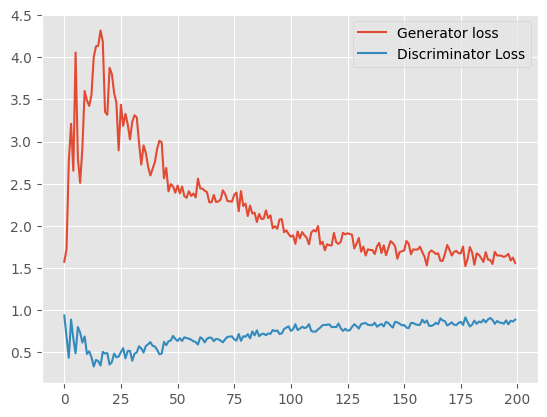

In [22]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

losses_g_cpu = [l.cpu().detach().numpy() for l in losses_g]
losses_d_cpu = [l.cpu().detach().numpy() for l in losses_d]
plt.figure()
plt.plot(losses_g_cpu, label='Generator loss')
plt.plot(losses_d_cpu, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')

We can see that for the first few epochs the loss values of the generator are increasing and the discriminator losses are decreasing. This is because during the initial phases the generator does not create any good fake images. The discriminator easily classifies between the real images and the fake images. As the training progresses, the generator slowly starts to generate more believable images. At this time, the discriminator also starts to classify some of the fake images as real. Therefore, the generator loss begins to decrease and the discriminator loss begins to increase.

Also, we can clearly see that training for more epochs will surely help.

Now, let’s look at the generated images.

In [23]:
!ls outputs


generator_images.gif  gen_img144.png  gen_img190.png  gen_img56.png
generator.pth	      gen_img145.png  gen_img191.png  gen_img57.png
gen_img0.png	      gen_img146.png  gen_img192.png  gen_img58.png
gen_img100.png	      gen_img147.png  gen_img193.png  gen_img59.png
gen_img101.png	      gen_img148.png  gen_img194.png  gen_img5.png
gen_img102.png	      gen_img149.png  gen_img195.png  gen_img60.png
gen_img103.png	      gen_img14.png   gen_img196.png  gen_img61.png
gen_img104.png	      gen_img150.png  gen_img197.png  gen_img62.png
gen_img105.png	      gen_img151.png  gen_img198.png  gen_img63.png
gen_img106.png	      gen_img152.png  gen_img199.png  gen_img64.png
gen_img107.png	      gen_img153.png  gen_img19.png   gen_img65.png
gen_img108.png	      gen_img154.png  gen_img1.png    gen_img66.png
gen_img109.png	      gen_img155.png  gen_img20.png   gen_img67.png
gen_img10.png	      gen_img156.png  gen_img21.png   gen_img68.png
gen_img110.png	      gen_img157.png  gen_img22.png   gen_img69.png

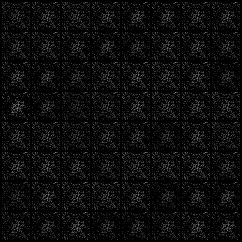

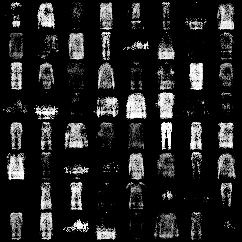

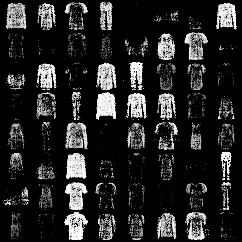

In [24]:
from IPython.display import Image
from IPython.display import display
image_paths = ['outputs/gen_img0.png','outputs/gen_img99.png','outputs/gen_img199.png']
display(Image(filename=image_paths[0]), Image(filename=image_paths[1]), Image(filename=image_paths[2]))


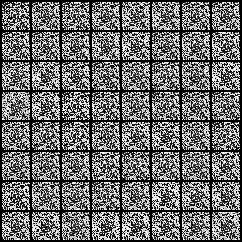

In [25]:
from IPython.display import Image
from IPython.display import display

# Replace 'path/to/your-gif.gif' with the path to your local GIF file
gif_path = 'outputs/generator_images.gif'

# Display the GIF
with open(gif_path, 'rb') as f:
    display(Image(data=f.read(), format='gif'))



Optional excercise
Modify the code to use the JS and Wasserstein distances and compare.